# Process images

1. Run through BRIA model to extract mask and background removed images
2. Crop and standardize images
3. Extract outline contours from mask using CV

In [1]:
from PIL import ImageOps

In [2]:
import sys
from pathlib import Path

pipeline_dir = Path("../pipeline").resolve()
if str(pipeline_dir) not in sys.path:
    sys.path.insert(0, str(pipeline_dir))

from remove_background import run_remove_background_step
from crop_standardize import standardize_single_image
from extract_mask_contours import (
    extract_outline_from_mask_image,
    draw_contours_from_mask_image,
    draw_inner_outer_contours_from_mask_image,
)
from utils import find_object_image_url, load_objects_json, save_images

/Users/oliviakasmin/Desktop/okasmin-parsons-thesis-2026/.venv/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/Users/oliviakasmin/Desktop/okasmin-parsons-thesis-2026/.venv/lib/python3.10/site-packages/timm/models/layers/__init__.py:49: FutureWarning: Importing from timm.models.layers is deprecated, please import via timm.layers
  warnings.warn(f"Importing from {__name__} is deprecated, please import via timm.layers", FutureWarning)
/Users/oliviakasmin/Desktop/okasmin-parsons-thesis-2026/.venv/lib/python3.10/site-packages/timm/models/registry.py:4: FutureWarning: Importing from timm.models.registry is deprecated, please import via timm.models
  warnings.warn(f"Importing from {__name__} is deprecated, please import via timm.models", FutureWarning)


In [3]:
object_ids = ["185901", "203377", "192803", "45529", "188908", "204512", "449904"]

In [4]:
objects = load_objects_json()

In [5]:
object_ids = ["185901", "203377", "192803", "45529", "188908", "204512", "449904"]

## Remove background from image

In [6]:
img_url = find_object_image_url(object_ids[0], objects)
no_bg_image, model_mask = run_remove_background_step(image_url=img_url)

In [7]:
# display(no_bg_image)
# display(model_mask)

## Crop/ standardize images

In [8]:
standardized, std_mask = standardize_single_image(no_bg_image, model_mask)

### Extract outline

In [9]:
contours, outer_contours, inner_contours, binary = extract_outline_from_mask_image(std_mask)

In [10]:
# contours

In [11]:
contours_image = draw_contours_from_mask_image(
    mask_image=std_mask, contours=contours, contour_color=(0, 0, 0, 255)
)

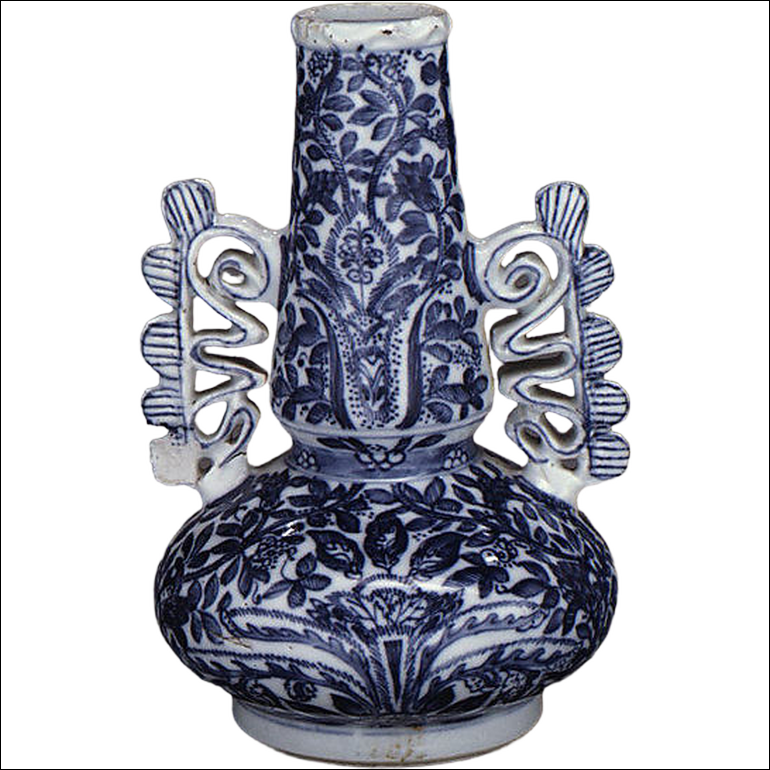

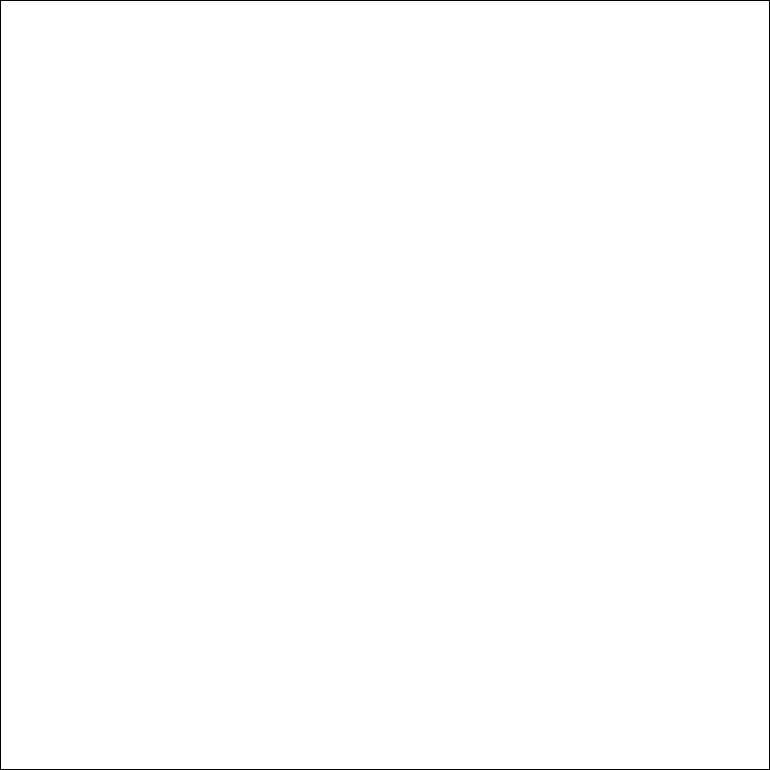

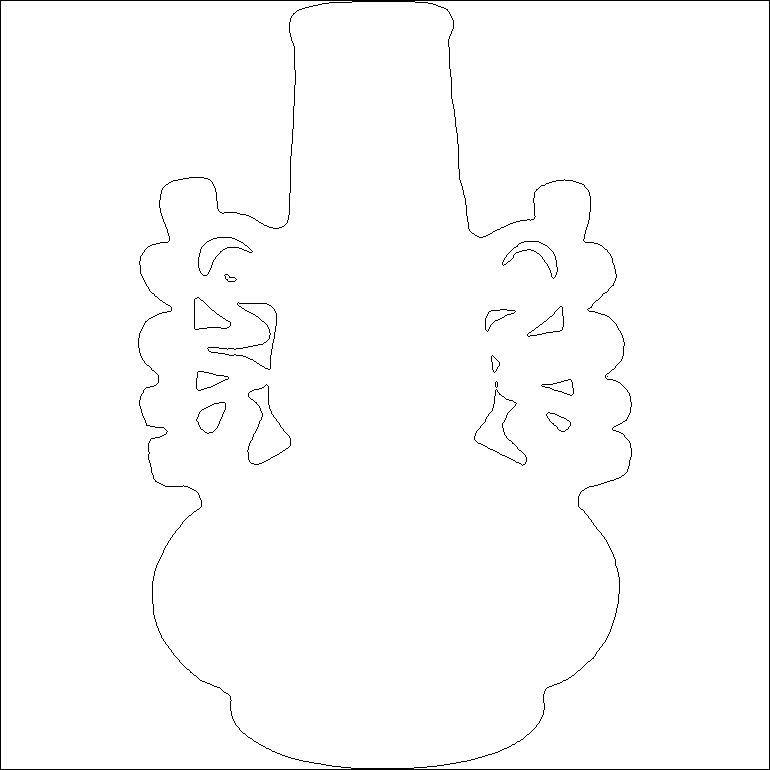

In [12]:
display(ImageOps.expand(standardized, border=1, fill="black"))
display(ImageOps.expand(std_mask, border=1, fill="black"))
display(ImageOps.expand(contours_image, border=1, fill="black"))

In [13]:
inner_outer_contours_image = draw_inner_outer_contours_from_mask_image(
    mask_image=std_mask,
    outer_contours=outer_contours,
    inner_contours=inner_contours,
    outer_color=(0, 255, 0, 255),
    inner_color=(255, 0, 0, 255),
)

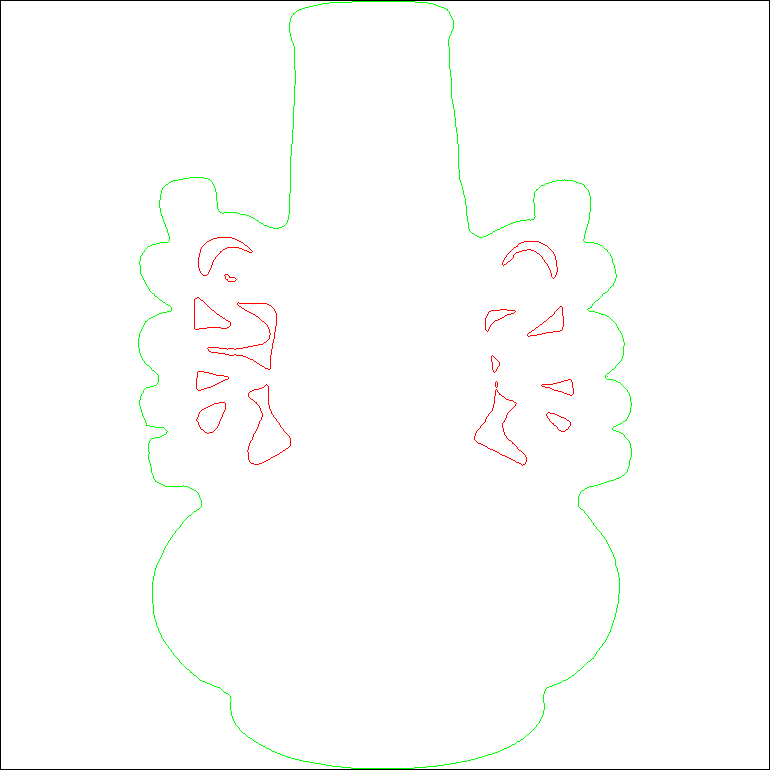

In [14]:
display(ImageOps.expand(inner_outer_contours_image, border=1, fill="black"))

In [17]:
def process_image(object_id):
    img_url = find_object_image_url(object_id, objects)
    no_bg_image, model_mask = run_remove_background_step(image_url=img_url)
    standardized, std_mask = standardize_single_image(no_bg_image, model_mask)
    contours, outer_contours, inner_contours, binary = extract_outline_from_mask_image(std_mask)
    contours_image = draw_contours_from_mask_image(mask_image=std_mask, contours=contours)
    display(ImageOps.expand(standardized, border=1, fill="black"))
    display(ImageOps.expand(std_mask, border=1, fill="black"))
    display(ImageOps.expand(contours_image, border=1, fill="black"))
    save_images(standardized, std_mask, contours_image, object_id)

    inner_outer_contours_image = draw_inner_outer_contours_from_mask_image(
        mask_image=std_mask,
        outer_contours=outer_contours,
        inner_contours=inner_contours,
        outer_color=(0, 255, 0, 255),
        inner_color=(255, 0, 0, 255),
    )
    display(ImageOps.expand(inner_outer_contours_image, border=1, fill="black"))

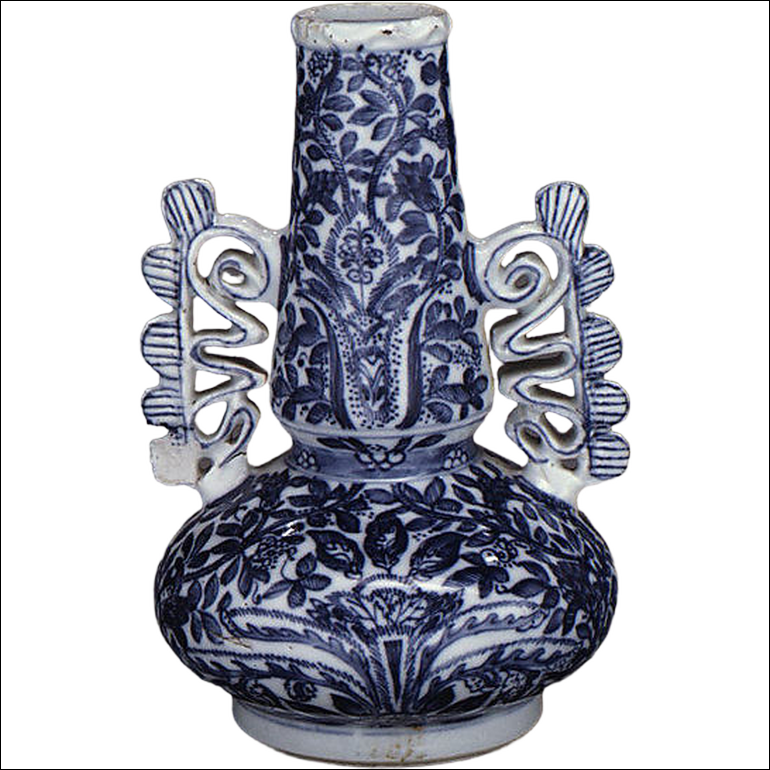

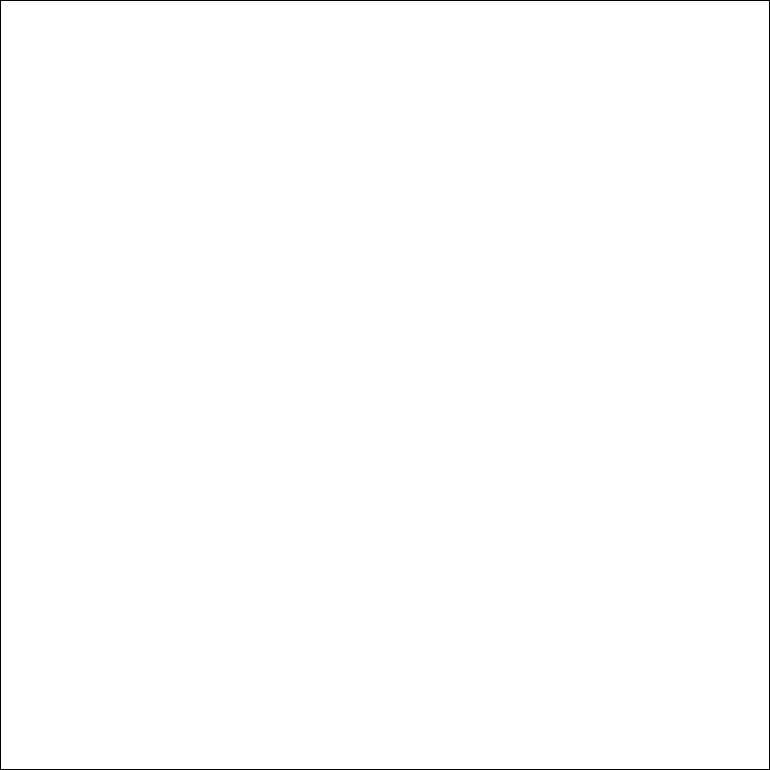

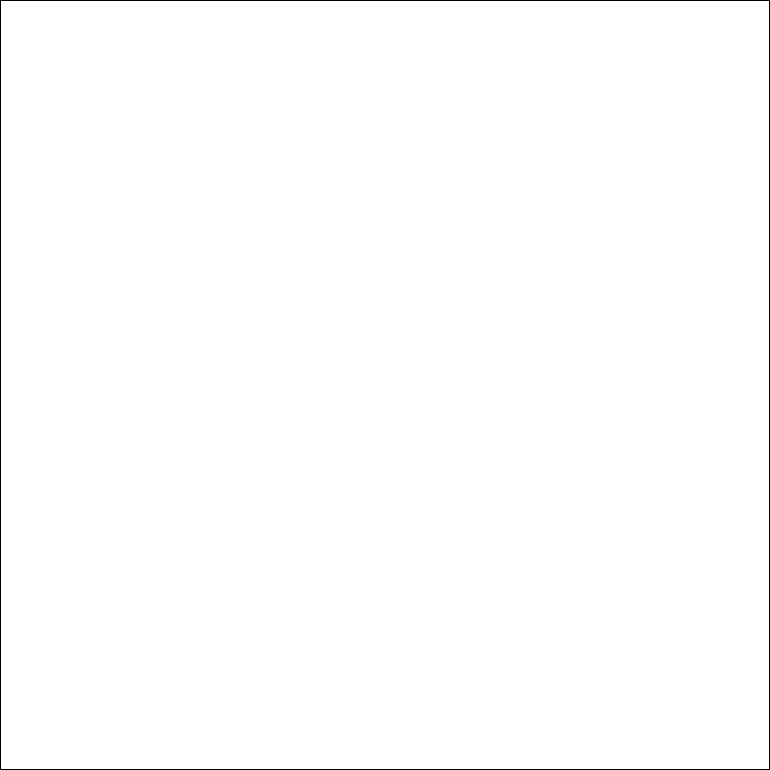

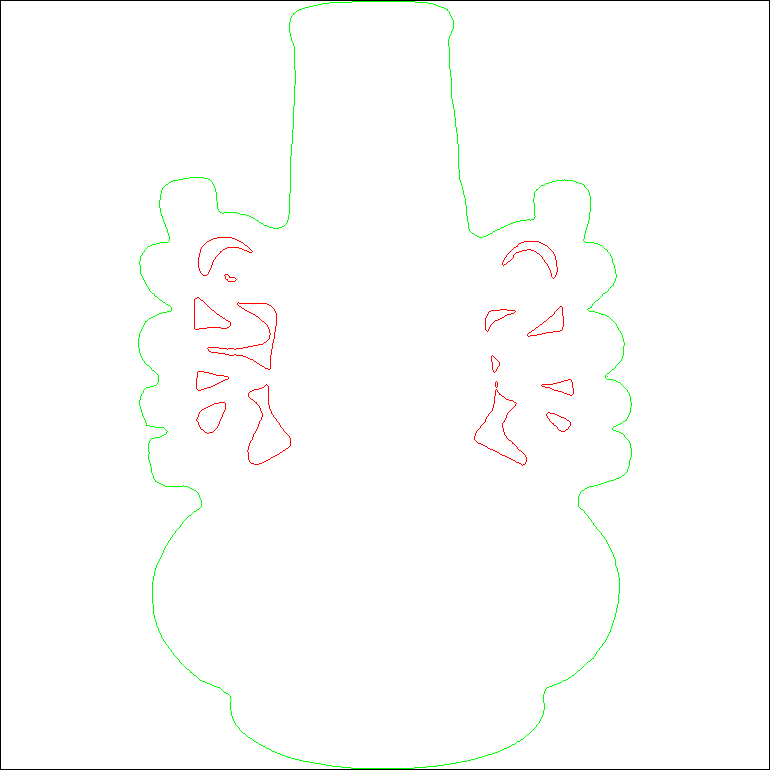

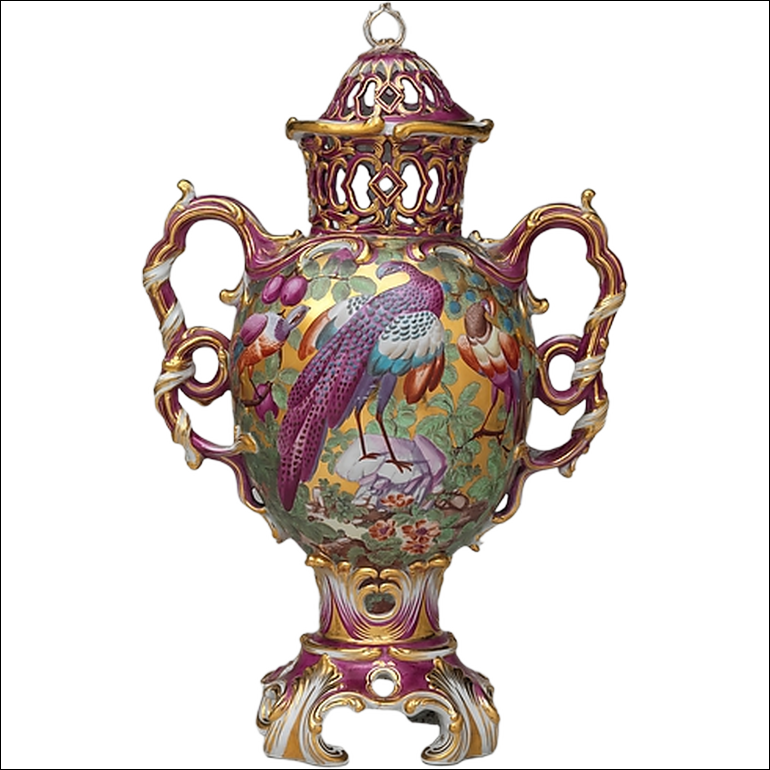

...

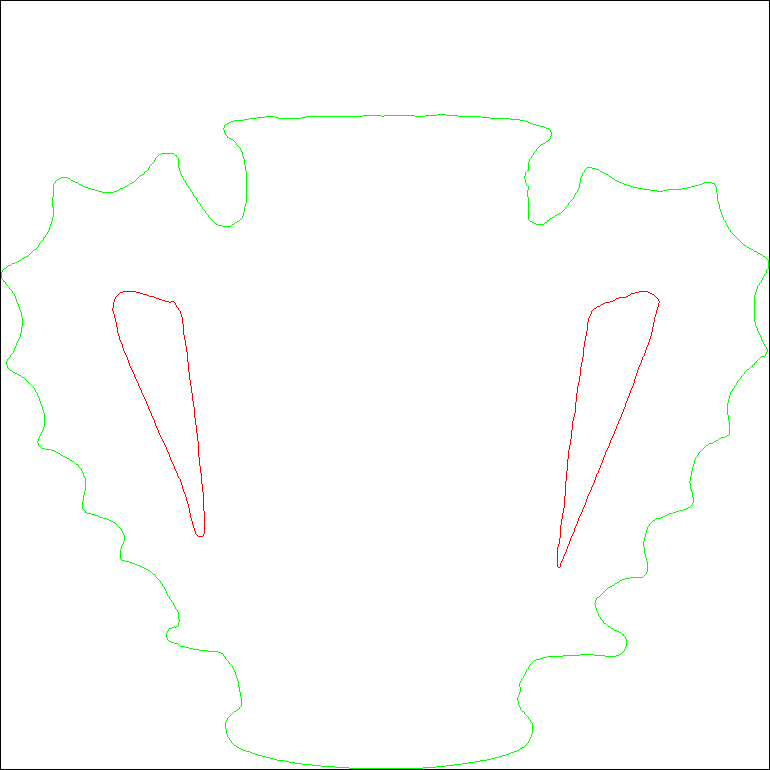

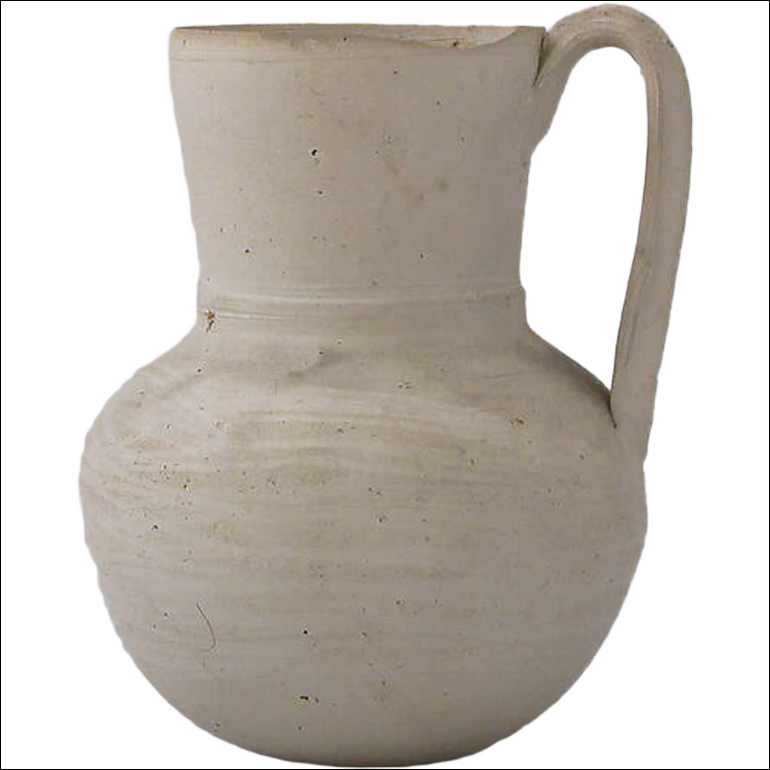

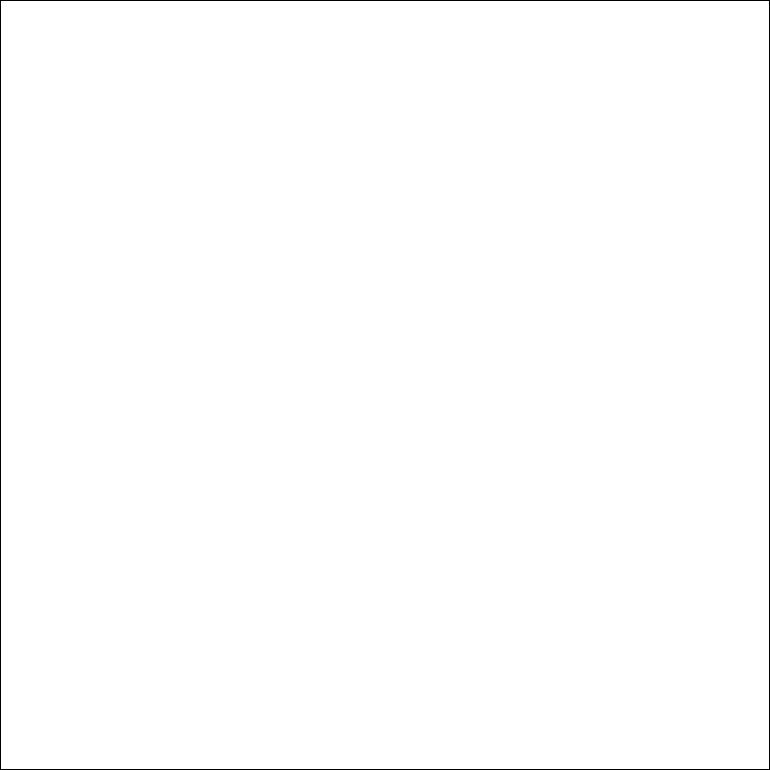

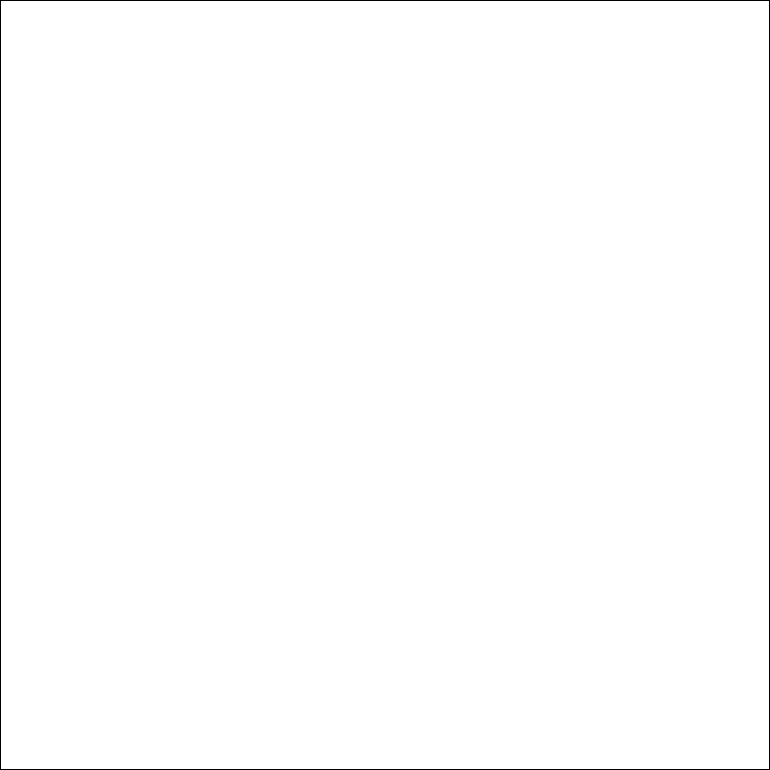

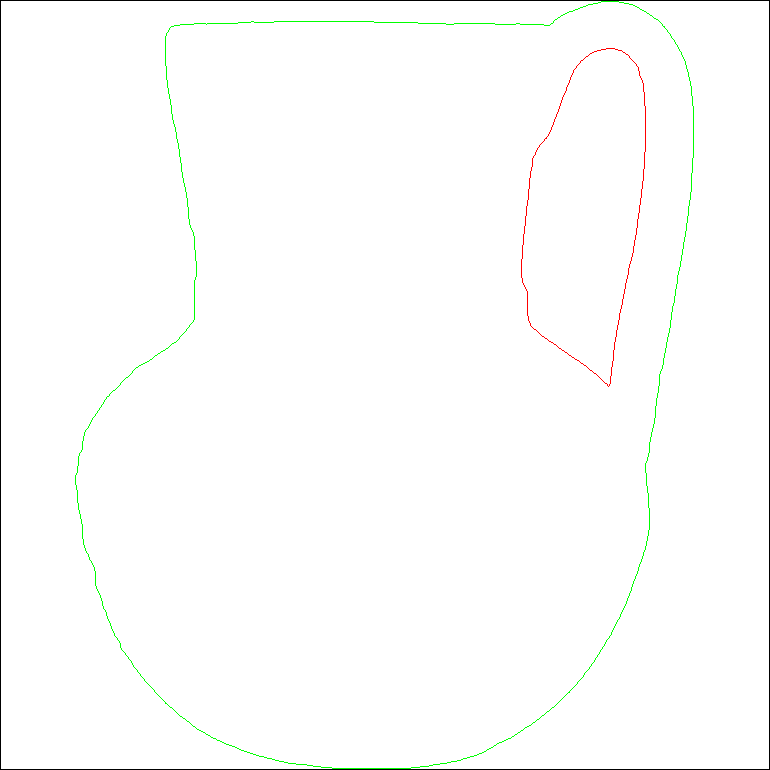

In [18]:
for id in object_ids:
    process_image(id)